In [1]:
from QEB import *
from scipy.stats import chi2

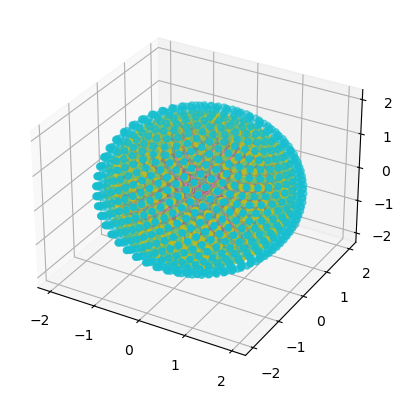

In [2]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# 创建3D图形对象
fig = plt.figure()
ax = plt.axes(projection='3d')
for i in range(1, 11):
    # 生成数据
    rad = 0.2 * i
    num_points = min(int((rad**2 / 0.2**2) * 40), 1000)
    points = generate_points_on_sphere(radius=rad, num_points=num_points)
    x = points[:, 0]
    y = points[:, 1]
    z = points[:, 2]

    # 绘制3D散点图
    ax.scatter3D(x, y, z)

# 显示图形
plt.savefig("../figures/grid_points")
plt.show()

In [2]:
MAX_RAD = 1
GAP = 0.2
wqeb = WQEB()
data = wqeb.read_data(
    root_map='./dataset/emd_11103.map', 
    root_pdb='./dataset/6z6u.pdb',
    atomic="CA",
    max_rad = MAX_RAD, 
    base_num_points=40, 
    max_points=1000, 
    gap=GAP, 
    start_rad=0
    )

/home/bookbnnbnn/work/Academia Sinica/Empirical_Bayes_Q-scores/QEB/utils.py:70: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  new_df = gb_defected.mean().reset_index()


  0%|          | 0/4128 [00:00<?, ?it/s]

In [ ]:
NUM = 10
IN_GROUP_NUM = 50
mse_0 = np.zeros((NUM, NUM))
mse_1 = np.zeros((NUM, NUM))
mse_hyper = np.zeros((NUM, NUM))
ratio_to_weights = np.zeros((NUM, NUM))
ratio_to_contaminated = np.zeros((NUM, NUM))
similarity = np.zeros((NUM, NUM))
wqeb = WQEB()
for i in tqdm(range(NUM)):
    contained_ratio_beta = 0.05 * i
    for j in range(NUM):
        contained_ratio_data = 0.05 * j
        wqeb.create_data(
            group_num=1, 
            group_name=["A"], 
            contained_ratio_data=contained_ratio_data, 
            contained_ratio_beta=contained_ratio_beta, 
            in_group_num=IN_GROUP_NUM
            )
        wqeb.paramters_initial()
        wqeb.algorithm_iter(iter_num=20, alpha=contained_ratio_data, gamma=contained_ratio_beta, verbose=False)
        mse_0[i][j], mse_1[i][j] = np.mean((wqeb.betas["A"] - wqeb.betas_WEB["A"])**2, axis=0)
        mse_hyper[i][j] = np.sum((wqeb.mus["A"] - wqeb.mus_mle["A"])**2) / 2
        ratio_to_weights[i][j] = np.mean(wqeb.lambdas["A"] / 500)
        ratio_to_contaminated[i][j] = np.median(wqeb.lambdas["A"][int(IN_GROUP_NUM * contained_ratio_data): ]) / np.median(wqeb.lambdas["A"][: int(IN_GROUP_NUM * contained_ratio_data)])
        similarity[i][j] = np.mean(wqeb.similarities["A"])

  0%|          | 0/10 [00:00<?, ?it/s]

/home/bookbnnbnn/miniconda3/envs/ai_cup3.10/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/bookbnnbnn/miniconda3/envs/ai_cup3.10/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/bookbnnbnn/work/Academia Sinica/Empirical_Bayes_Q-scores/QEB/utils.py:559: RuntimeWarning: Mean of empty slice.
  mean_densities.append(densities_chosen.mean())


In [ ]:
# wqeb = WQEB()
# wqeb.create_data(
#             group_num=1, 
#             group_name=["A"], 
#             contained_ratio_data=0.14, 
#             contained_ratio_beta=0.2, 
#             in_group_num=1
#             )

In [ ]:
from matplotlib import cbook
from matplotlib import cm
from matplotlib.colors import LightSource
import matplotlib.pyplot as plt
import numpy as np

def simulation_plot(data, zlabel, title, min_num=0, max_num=0.5):
    z = data
    nrows, ncols = z.shape
    x = np.linspace(min_num, max_num, ncols)
    y = np.linspace(min_num, max_num, nrows)
    x, y = np.meshgrid(x, y)

    # Set up plot
    fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), constrained_layout=True)

    ls = LightSource(270, 45)
    # To use a custom hillshading mode, override the built-in shading and pass
    # in the rgb colors of the shaded surface calculated from "shade".
    rgb = ls.shade(z, cmap=cm.gist_earth, vert_exag=0.1, blend_mode='soft')
    surf = ax.plot_surface(x, y, z, rstride=1, cstride=1, facecolors=rgb,
                        linewidth=0, antialiased=False, shade=False)    
    ax.set_xlabel("Contaminated ratio of points")
    ax.set_ylabel("Contaminated ratio of betas")
    ax.set_zlabel(zlabel, rotation=90, labelpad=-0.6)
    ax.dist = 11
    # ax.zaxis.labelpad = -0.6
    plt.title(title)
    plt.savefig("../figures/" + title)
    plt.show()

/tmp/ipykernel_10386/1732115093.py:26: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = 11


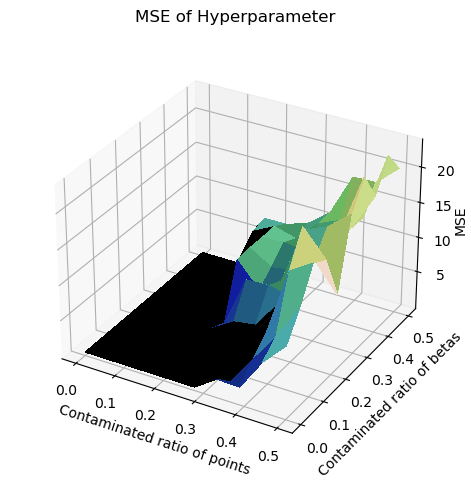

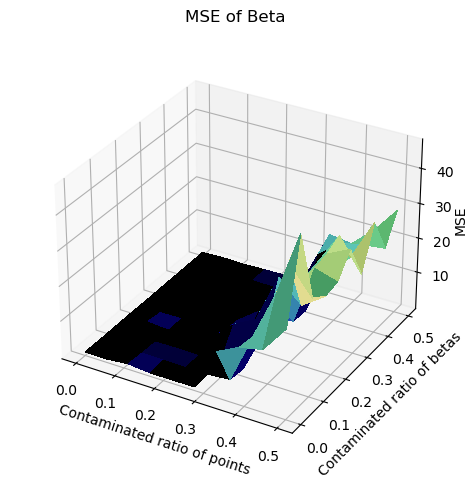

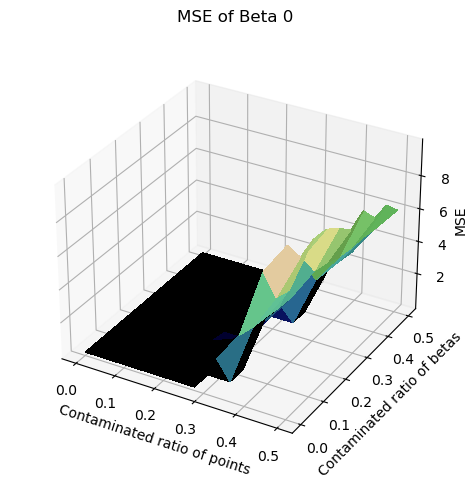

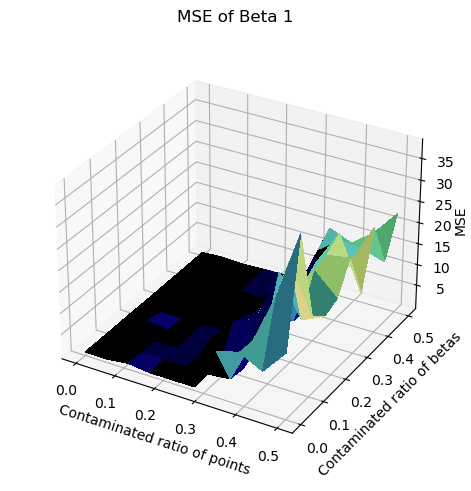

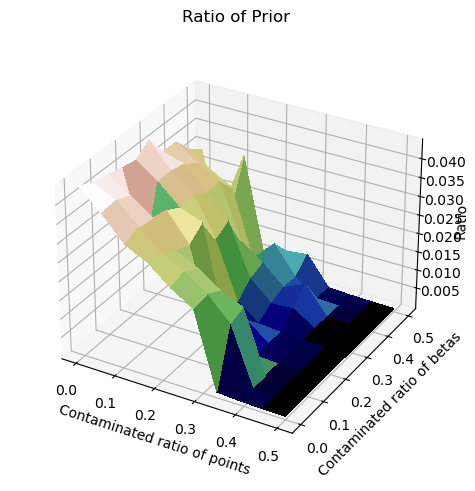

In [ ]:
simulation_plot(mse_hyper, "MSE", "MSE of Hyperparameter")
simulation_plot(mse_0 + mse_1, "MSE", "MSE of Beta")
simulation_plot(mse_0, "MSE", "MSE of Beta 0")
simulation_plot(mse_1, "MSE", "MSE of Beta 1")
simulation_plot(ratio_to_weights, "Ratio", "Ratio of Prior")
# simulation_plot(A, "Ratio", "Ratio of Contaminated Data")
# simulation_plot(similarity, "Similarity", "Fitted Similarity")

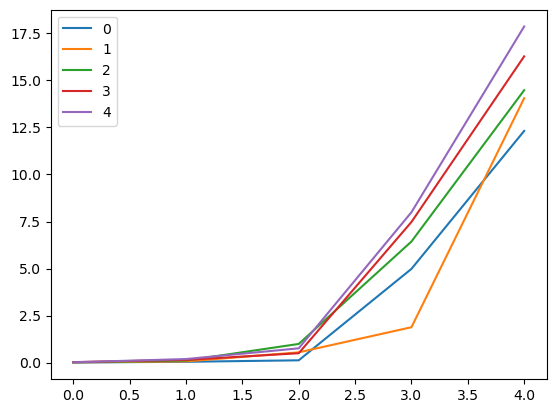

In [ ]:
for i in range(NUM):
    plt.plot(mse_0[i], label=i)
plt.legend()

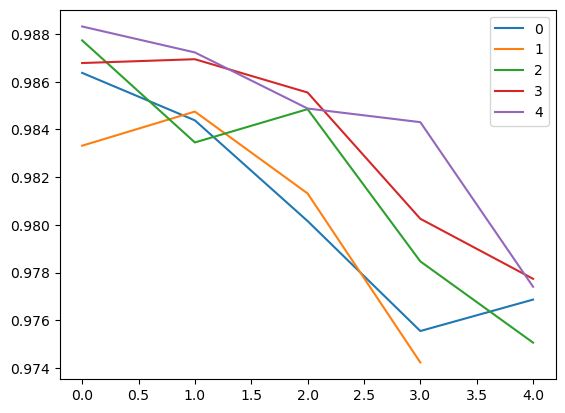

In [ ]:
for i in range(NUM):
    plt.plot(similarity[i], label=i)
plt.legend()

In [2]:
wqeb = WQEB()
data = wqeb.create_data(group_num=1, group_name=["A"], contained_ratio_data=0.2, contained_ratio_beta=0.2, in_group_num = 100)

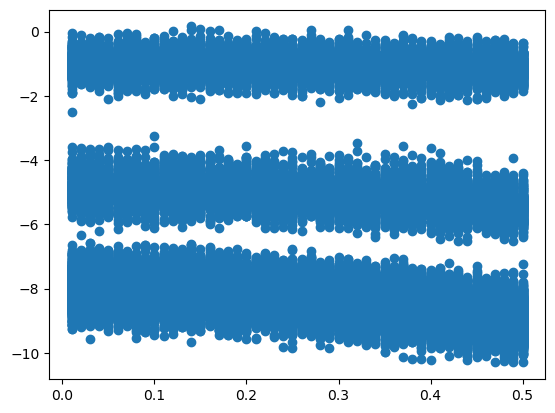

In [4]:
plt.scatter(wqeb.distances_to_center["A"].flatten(), wqeb.data_log["A"].flatten())

In [3]:
_ = wqeb.paramters_initial()

In [4]:
betas_WEB, history = wqeb.algorithm_iter(max_iter=20, alpha=0.1, gamma=0.1, tol=1e-5)

  0%|          | 0/20 [00:00<?, ?it/s]

INFO:root:Iteration 0 finished. with difference: 12.598220048191825
INFO:root:Iteration 1 finished. with difference: 31.792561529859707
INFO:root:Iteration 2 finished. with difference: 0.13960542346947724
INFO:root:Iteration 3 finished. with difference: 0.02934362079175797
INFO:root:Iteration 4 finished. with difference: 0.005747354225539298
INFO:root:Iteration 5 finished. with difference: 0.0012211336288509465
INFO:root:Iteration 6 finished. with difference: 0.0002642446478740154
INFO:root:Iteration 7 finished. with difference: 5.780926259369016e-05
INFO:root:Iteration 8 finished. with difference: 1.2556547993789265e-05
INFO:root:Iteration 9 finished. with difference: 2.820844766450277e-06


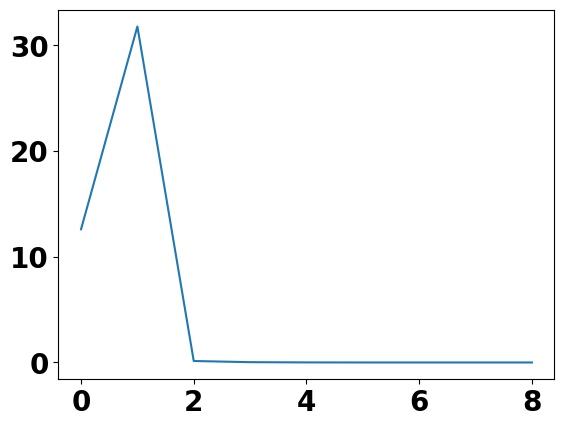

In [83]:
plt.plot(wqeb.beta_differences_histories)

In [54]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

def plot_scatter_with_concentric_circles(data, center_x, center_y, num_circles, spacing, margin=None):
    font = {'weight' : 'bold', 'size': 10}
    matplotlib.rc('font', **font)
    fig, ax = plt.subplots()

    # 绘制散点图
    x = data[:, 0]
    y = data[:, 1]
    ax.scatter(x, y, color='blue', label='Betas WEB', s=3, alpha=0.5)

    # 绘制同心圆
    for i in range(1, num_circles + 1):
        radius = i * spacing
        circle = Circle((center_x, center_y), radius, fill=False, color='green', linestyle='dashed')
        ax.add_patch(circle)
    if margin:
        circle = Circle((center_x, center_y), margin, fill=False, color='red')
        ax.add_patch(circle)

    max_radius = num_circles * spacing + spacing
    # ax.set_xlim(center_x - max_radius, center_x + max_radius)
    # ax.set_ylim(center_y - max_radius, center_y + max_radius)
    ax.set_aspect('equal', adjustable='box')
    plt.gca().set_aspect('equal', adjustable='box')

    plt.title('Scatter Plot with Concentric Circles')
    plt.xlabel('Beta_0')
    plt.ylabel('Beta_1')
    plt.grid(True)
    plt.legend()

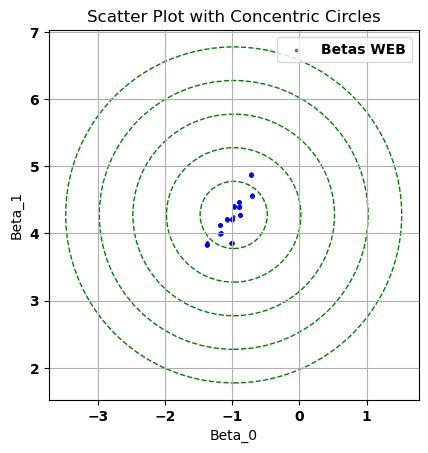

In [52]:
name = "ALA"
plot_scatter_with_concentric_circles(wqeb.betas_WEB[name], *wqeb.mus_mle[name], 5, 0.5)

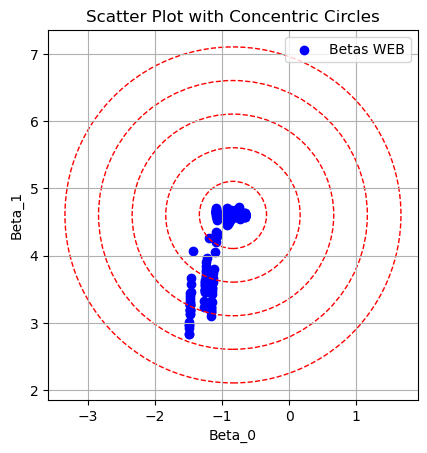

In [16]:
name = "ALA"
plot_scatter_with_concentric_circles(wqeb.betas_WEB[name], *wqeb.mus_mle[name], 5, 0.5, name)

In [7]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

def plot_scatter_with_concentric_circles(ax, data, center_x, center_y, num_circles, spacing, name):
    # 绘制散点图
    x = data[:, 0]
    y = data[:, 1]
    ax.scatter(x, y, color='blue', label='Betas WEB', s=2)

    # 绘制同心圆
    for i in range(1, num_circles + 1):
        radius = i * spacing
        circle = Circle((center_x, center_y), radius, fill=False, color='red', linestyle='dashed')
        ax.add_patch(circle)

    max_radius = num_circles * spacing + spacing
    # ax.set_xlim(center_x - max_radius, center_x + max_radius)
    # ax.set_ylim(center_y - max_radius, center_y + max_radius)
    ax.set_aspect('equal', adjustable='box')
    ax.set_aspect('equal', adjustable='box')

    ax.set_title(name)
    ax.set_xlabel('Beta_0')
    ax.set_ylabel('Beta_1')
    ax.grid(True)
    # ax.legend()


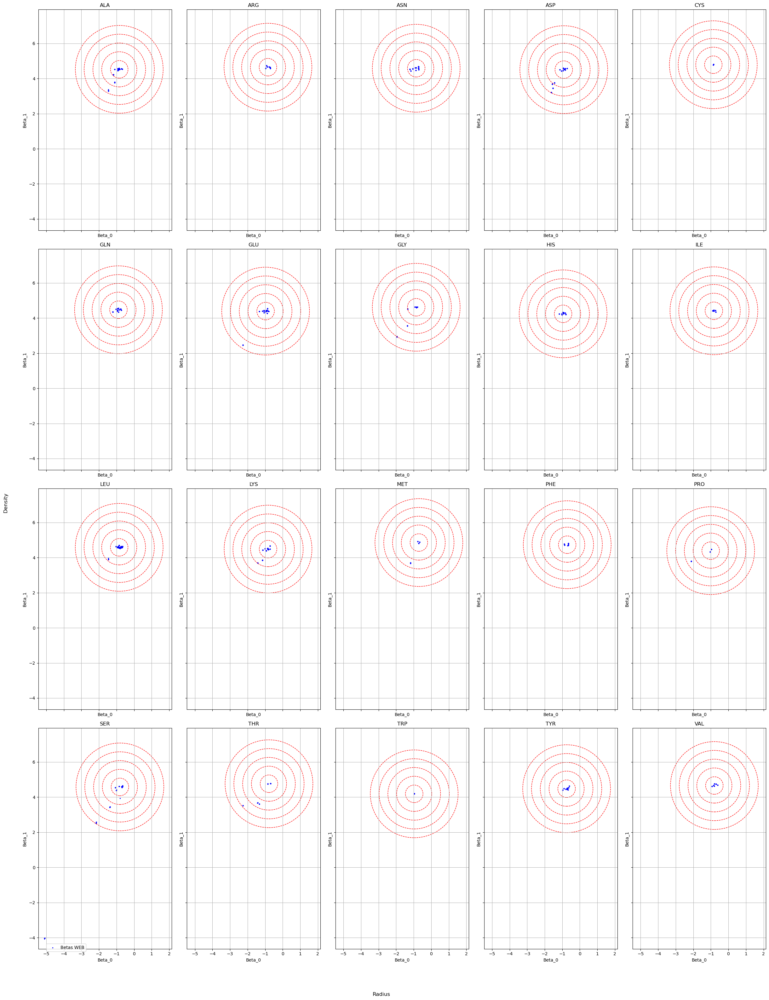

In [8]:

max_radius = 1
gap = 0.01
subplots_num = len(wqeb.data_log)
nums = int(subplots_num / 5) + 1 if subplots_num % 5 != 0 else int(subplots_num / 5)
fig, axes = plt.subplots(nums, 5, figsize=(25, nums * 8), sharex=True, sharey=True, squeeze=False)
x = np.arange(0, max_radius - gap, gap)
length = len(x)

for times, name in enumerate(wqeb.data_log): 
    i = times // 5
    j = times % 5
    plot_scatter_with_concentric_circles(axes[i][j], wqeb.betas_WEB[name], *wqeb.mus_mle[name], 5, 0.5, name)

labels_handles = {
label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())
}

fig.legend(
labels_handles.values(),
labels_handles.keys(),
loc = "upper center",
bbox_to_anchor = (0.1, 0.065),
bbox_transform = plt.gcf().transFigure,
)
fig.supxlabel('Radius')
fig.supylabel('Density')
plt.tight_layout()
fig.tight_layout(rect=(0.025, 0.03, 1, 1))

In [8]:
for name in wqeb.similarities:
    print(name, np.min(wqeb.similarities[name]))

ALA 0.9899502206875377
ARG 0.9901224161534106
ASN 0.9798044208309957
ASP 0.9867760930227469
CYS 0.9971477968517045
GLN 0.9935971595551254
GLU 0.9734893290979817
GLY 0.9891347879418774
HIS 0.9931169455185742
ILE 0.9864498383683932
LEU 0.9898033797476777
LYS 0.9913924094386984
MET 0.9851165969402036
PHE 0.9965956604567121
PRO 0.9897561328724543
SER 0.8738284782294441
THR 0.9911218381294103
TRP 0.9930482231850369
TYR 0.9942710831171228
VAL 0.9934034666642236


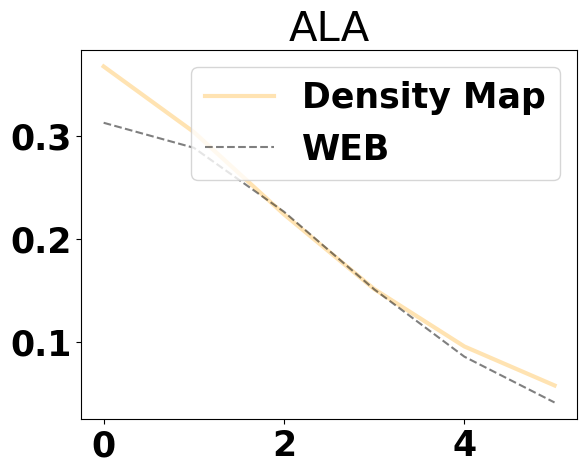

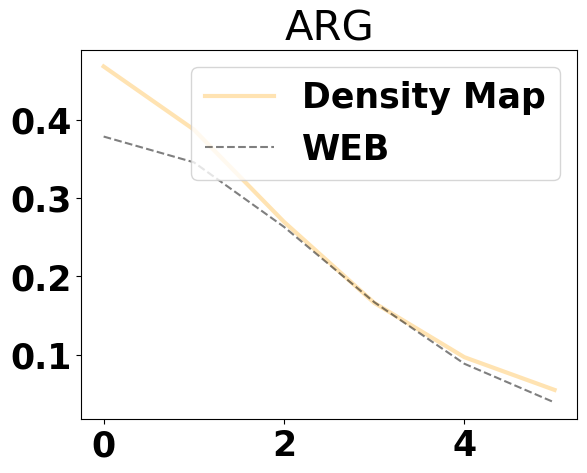

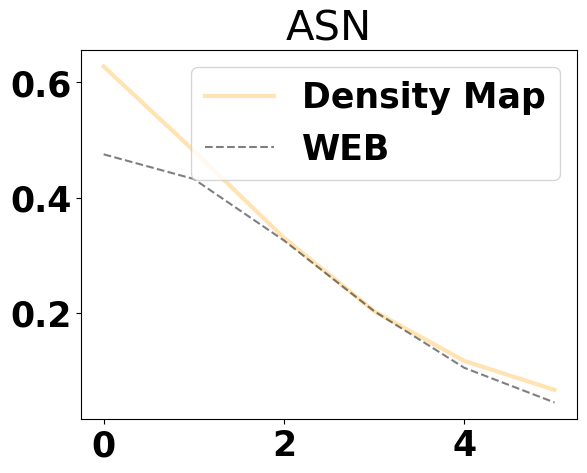

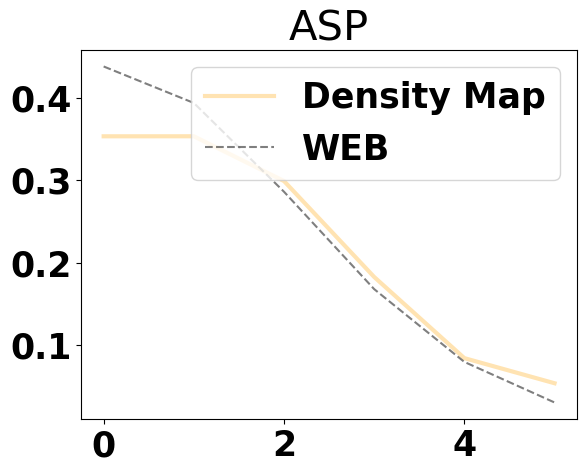

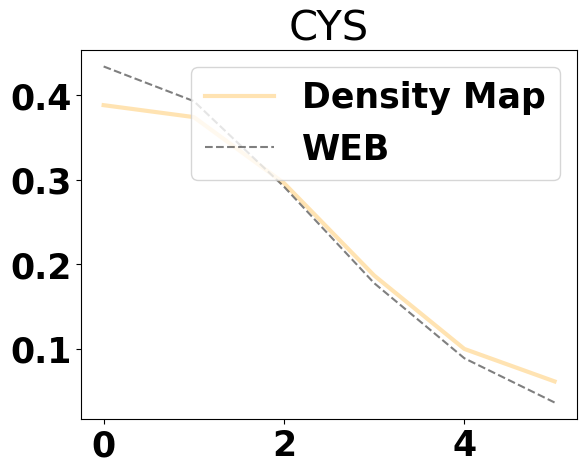

...

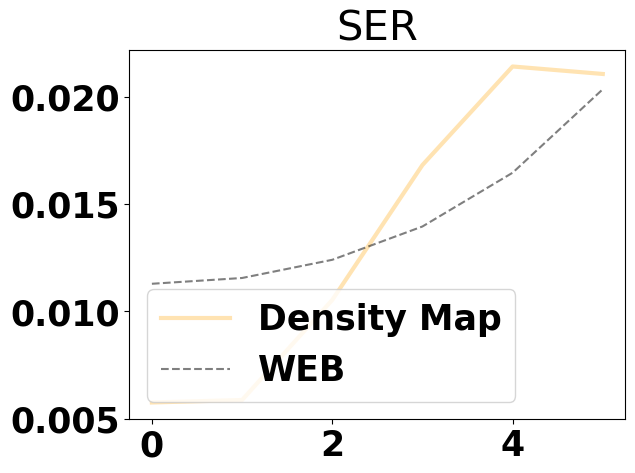

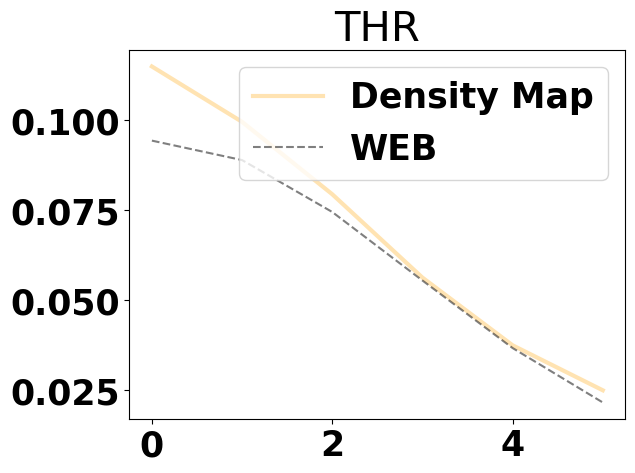

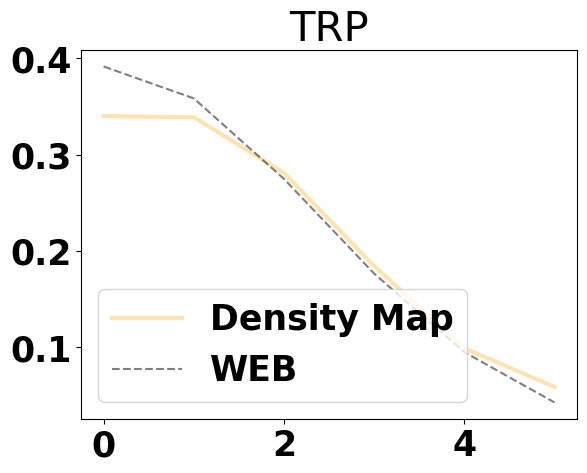

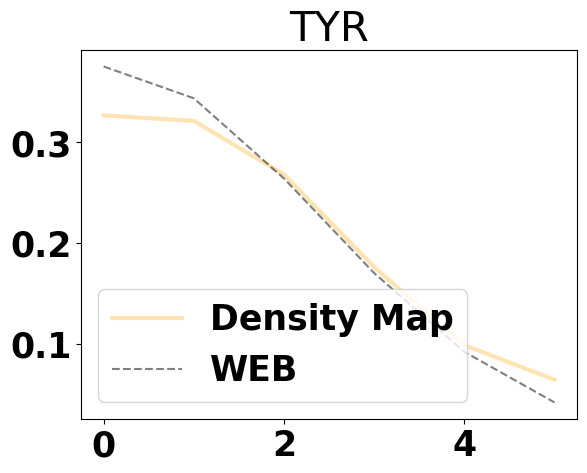

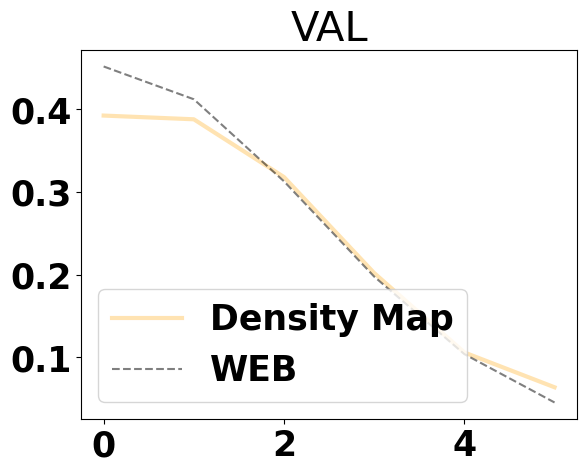

In [16]:
for name in wqeb.similarities:
    index = np.where(wqeb.similarities[name] == np.min(wqeb.similarities[name]))[0][0]
    plt.plot(wqeb.densities_data[name][index], linewidth=3, alpha=0.3, c="orange", label="Density Map")
    # plt.plot(wqeb.densities_betas_weighted[name][index], linestyle="--", c="blue", alpha=0.5, label="Weighted")
    plt.plot(wqeb.densities_betas_WEB[name][index], linestyle="--", c="black", alpha=0.5, label="WEB")
    plt.legend()
    plt.title(name)
    plt.show()

IndexError: index 58 is out of bounds for axis 0 with size 58

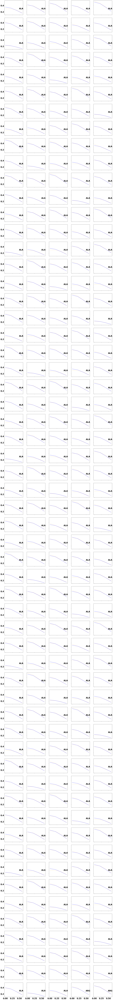

KeyboardInterrupt: 

In [ ]:
plot_density(wqeb.densities_data, [wqeb.densities_betas_WEB], 1, 0.2, labels=["WEB"], colors=["blue"], subplots_num=288, separated=True)

In [ ]:
# lengths = 0
# for name, similarities in wqeb.similarities.items():
#     indexes = np.where(np.array(similarities) < 0.95)[0]
#     lengths += len(indexes)
#     for idx in indexes:
#         plt.plot(wqeb.densities_data[name][idx])
#         plt.plot(wqeb.densities_estimated[name][idx])
#         plt.show()
# # lengths

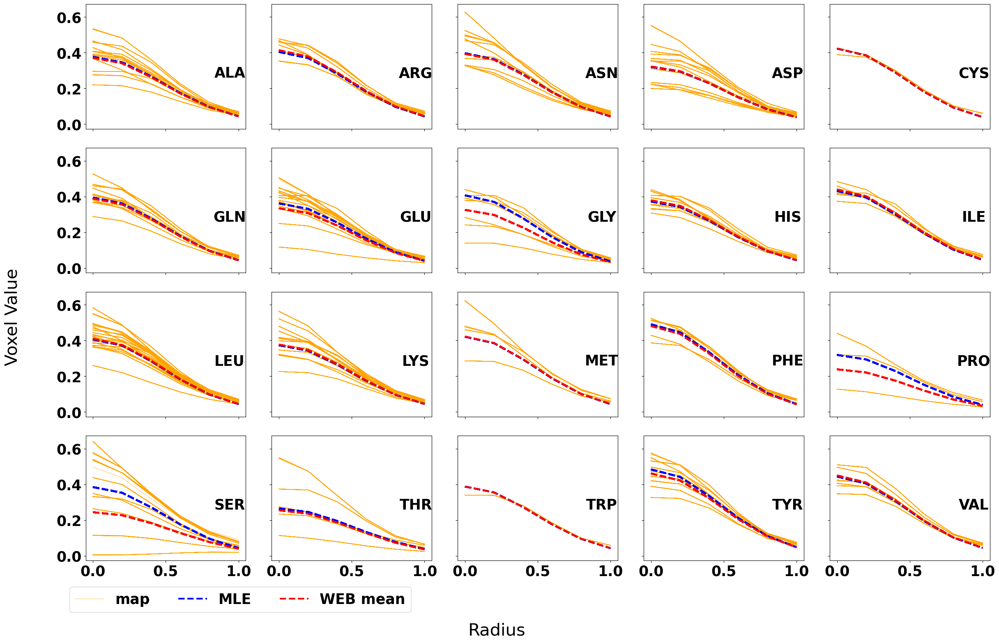

In [9]:
wqeb.plot_data(max_radius=MAX_RAD, gap=GAP, root= "../figures/densities_compared.png")

In [24]:
from scipy.stats import multivariate_normal, chi2
outliers = {}
statistic_distances = {}
_, margin = chi2.interval(0.99, 1)
# margin = 1
for name in wqeb.betas_WEB:
    outliers[name] = []
    statistic_distances[name] = []
    sigmas = wqeb.sigmas_median[name] 
    mean = wqeb.mus_mle[name]
    betas = wqeb.betas_WEB[name]
    lambdas = wqeb.lambdas[name]
    weight_matrixs = wqeb.weights[name]
    datas_density = wqeb.densities_data[name]
    estimated_density = wqeb.densities_betas_WEB[name]
    mle_density = wqeb.densities_mle[name]
    # sigma_matrix = np.sum([lambdas[i] * (betas - mean)[i].reshape(-1, 1) @ (betas - mean)[i].reshape(-1, 1).T for i in range(len(betas))], axis=0) / np.sum(lambdas) 
    sigma = np.sum([lambdas[i] * (betas - mean)[i][0] ** 2 for i in range(len(betas))]) / (sum(lambdas) - 1)
    for i in range(len(betas)):
        # sigma_matrix = wqeb.sigmas_median[name][i] * np.eye(len(mle_density))
        # sigma_matrix = sigmas[i] * weight_matrixs[i]
        
        statistic_distance = (betas - mean)[i][0] ** 2 / sigma
        # Z = (mle_density - datas_density[i]).reshape(-1, 1)
        # Z = (datas[i] - np.exp(X @ mean)).reshape(-1, 1)
        # statistic_distance = (Z.T @ Z).flatten()
        # statistic_distance = (betas[i] - mean).T @np.linalg.inv(sigma[i] * np.eye(2)) @ (betas[i] - mean)
        statistic_distances[name].append(np.round(statistic_distance, 2))
        if statistic_distance > margin:
            outliers[name].append(i)

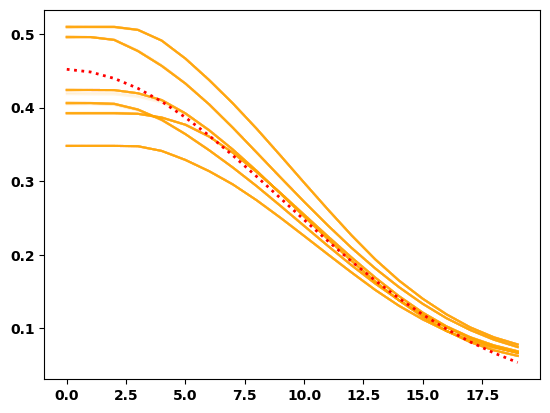

In [25]:
name = "VAL"
outliers[name]
for idx, density in enumerate(wqeb.densities_data[name]):
    if idx in outliers[name]:
        plt.plot(density, color="black", linewidth=1, linestyle="--")
    else:
        plt.plot(density, color="orange", alpha=0.1)
        
plt.plot(wqeb.densities_mle[name], color="red", linewidth=2, linestyle=":")

In [26]:
densities_outliers = {}
for name in wqeb.densities_data:
    densities_outliers[name] =wqeb.densities_data[name][outliers[name]]

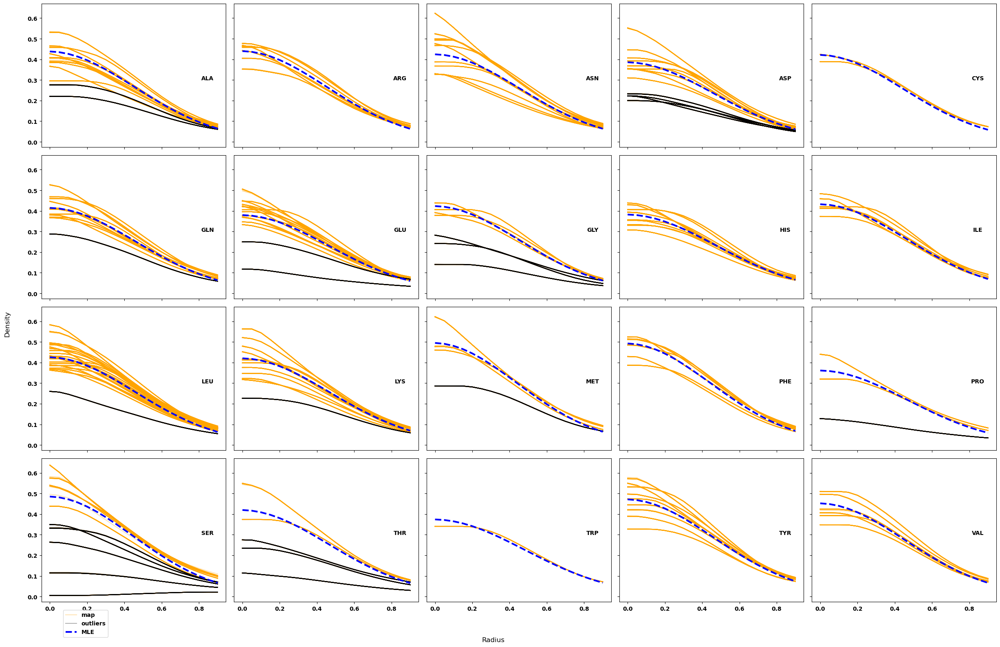

In [28]:

max_radius = 1
gap = 0.05
subplots_num = len(densities_outliers)
nums = int(subplots_num / 5) + 1 if subplots_num % 5 != 0 else int(subplots_num / 5)
fig, axes = plt.subplots(nums, 5, figsize=(25, nums * 4), sharex=True, sharey=True, squeeze=False)
x = np.arange(0, max_radius - gap, gap)
length = len(x)

for times, name in enumerate(densities_outliers): 
    i = times // 5
    j = times % 5
    for density in wqeb.densities_data[name]:
        axes[i][j].plot(x, density[:length], alpha=0.3, c="orange", label="map")
    for density_outliers in densities_outliers[name]:
        axes[i][j].plot(x, density_outliers[:length], alpha=0.3, c="black", label="outliers")
    axes[i][j].plot(x, wqeb.densities_mle[name][:length], label="MLE", linestyle="--", c="blue", linewidth=3)
    axes[i][j].text(0.9, 0.5, name, horizontalalignment='center', verticalalignment='top', transform=axes[i][j].transAxes)

labels_handles = {
label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())
}

fig.legend(
labels_handles.values(),
labels_handles.keys(),
loc = "upper center",
bbox_to_anchor = (0.1, 0.065),
bbox_transform = plt.gcf().transFigure,
)
fig.supxlabel('Radius')
fig.supylabel('Density')
plt.tight_layout()
fig.tight_layout(rect=(0.025, 0.03, 1, 1))
fig.savefig("../figures/outliers_beta0.png")

In [86]:
from scipy.stats import multivariate_normal, chi2
outliers = {}
statistic_distances0 = {}
statistic_distances1 = {}
_, margin = chi2.interval(0.99, 1)
sigmas = {}
for name in wqeb.betas_WEB:
    outliers[name] = []
    statistic_distances0[name] = [] 
    statistic_distances1[name] = [] 
    mean = wqeb.mus_mle[name]
    betas = wqeb.betas_WEB[name]
    lambdas = wqeb.lambdas[name]
    sigma0 = np.sum([lambdas[i] * (betas - mean)[i][0] ** 2 for i in range(len(betas))]) / (sum(lambdas) - 1)
    sigma1 = np.sum([lambdas[i] * (betas - mean)[i][1] ** 2 for i in range(len(betas))]) / (sum(lambdas) - 1)
    for i in range(len(betas)):
        sigmas[name] = np.array([sigma0, sigma1])
        statistic_distance0 = (betas - mean)[i][0] ** 2 / sigma0
        statistic_distance1 = (betas - mean)[i][1] ** 2 / sigma1
        statistic_distances0[name].append(np.round(statistic_distance0, 2))
        statistic_distances1[name].append(np.round(statistic_distance1, 2))
        if statistic_distance1 > margin:
            outliers[name].append(i)

In [87]:
densities_outliers = {}
for name in wqeb.densities_data:
    densities_outliers[name] =wqeb.densities_data[name][outliers[name]]

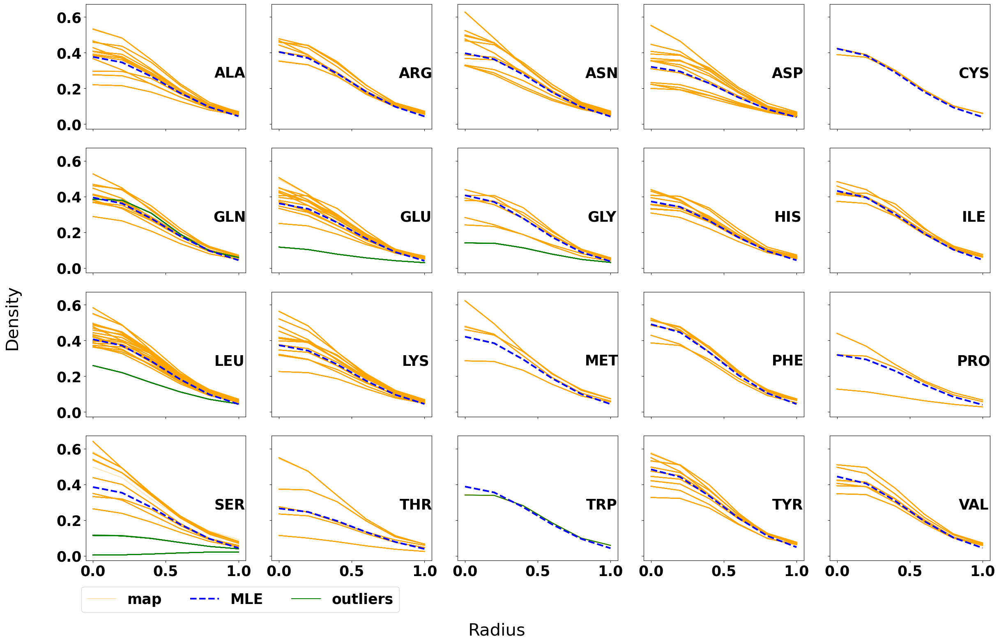

In [88]:
font = {'weight' : 'bold', 'size': 25}
matplotlib.rc('font', **font)
max_radius = MAX_RAD
gap = GAP
subplots_num = len(densities_outliers)
nums = int(subplots_num / 5) + 1 if subplots_num % 5 != 0 else int(subplots_num / 5)
fig, axes = plt.subplots(nums, 5, figsize=(25, nums * 4), sharex=True, sharey=True, squeeze=False)
x = np.arange(0, max_radius + gap, gap)
length = len(x)

for times, name in enumerate(densities_outliers): 
    i = times // 5
    j = times % 5
    for density in wqeb.densities_data[name]:
        axes[i][j].plot(x, density[:length], alpha=0.3, c="orange", label="map")
    for density_outliers in densities_outliers[name]:
        axes[i][j].plot(x, density_outliers[:length], alpha=1, c="green", label="outliers")
    axes[i][j].plot(x, wqeb.densities_mle[name][:length], label="MLE", linestyle="--", c="blue", linewidth=3)
    axes[i][j].text(0.9, 0.5, name, horizontalalignment='center', verticalalignment='top', transform=axes[i][j].transAxes)

labels_handles = {
label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())
}

fig.legend(
labels_handles.values(),
labels_handles.keys(),
loc = "upper center",
bbox_to_anchor = (0.25, 0.1),
bbox_transform = plt.gcf().transFigure,
ncol=3
)
fig.supxlabel('Radius')
fig.supylabel('Density')
plt.tight_layout()
fig.tight_layout(rect=(0.025, 0.03, 1, 1))
fig.savefig("../figures/outliers_beta0.png")

In [77]:
sigmas

{'ALA': array([0.03576053, 0.0802115 ]),
 'ARG': array([0.00962271, 0.01863922]),
 'ASN': array([0.0301933 , 0.05529546]),
 'ASP': array([0.07729508, 0.20546135]),
 'CYS': array([1.05121798e-05, 1.00714850e-02]),
 'GLN': array([0.01710802, 0.04120307]),
 'GLU': array([0.04228722, 0.11699743]),
 'GLY': array([0.0732263 , 0.10279953]),
 'HIS': array([0.00947631, 0.03866042]),
 'ILE': array([0.00527462, 0.08206014]),
 'LEU': array([0.02323146, 0.05326331]),
 'LYS': array([0.03033008, 0.0612277 ]),
 'MET': array([0.02560457, 0.0647033 ]),
 'PHE': array([0.01119778, 0.07315858]),
 'PRO': array([0.1508469 , 0.12001267]),
 'SER': array([0.06910013, 0.12610221]),
 'THR': array([0.20883712, 0.25807946]),
 'TRP': array([6.95816629e-07, 1.08344658e-05]),
 'TYR': array([0.01497264, 0.07072579]),
 'VAL': array([0.00875136, 0.01325661])}

In [78]:
import seaborn as sns

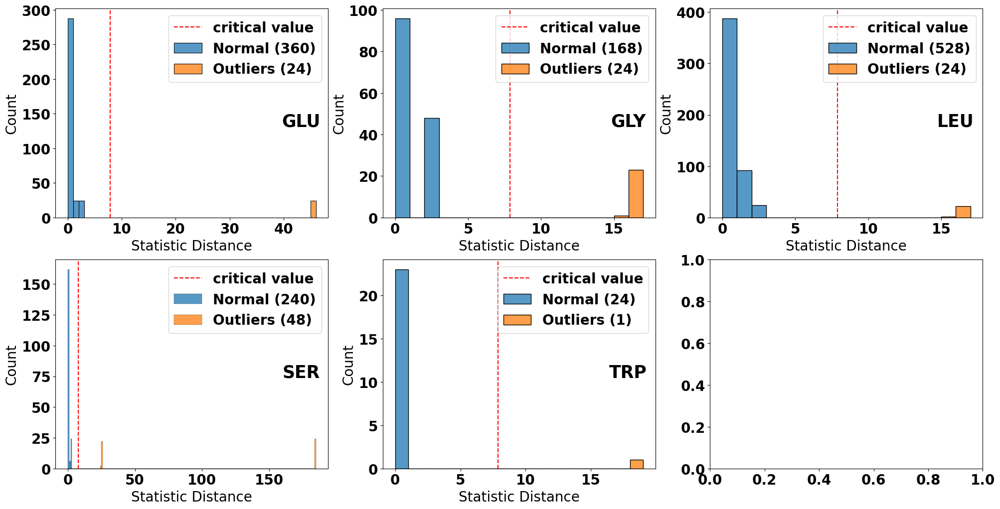

In [79]:
font = {'weight' : 'bold', 'size': 20}
matplotlib.rc('font', **font)
times = 0
fig, axes = plt.subplots(2, 3, figsize=(24, 12),squeeze=False)
for name in outliers:
    if len(outliers[name]) > 0:
        i = times // 3
        j = times % 3
        normal_index = ~np.isin(np.arange(0, len(statistic_distances0[name])), outliers[name])
        sns.histplot(np.array(statistic_distances0[name])[normal_index], bins=np.arange(0, max(statistic_distances0[name]) + 1), label=f"Normal ({len(normal_index)})", ax=axes[i][j])
        sns.histplot(np.array(statistic_distances0[name])[outliers[name]], bins=np.arange(0, max(statistic_distances0[name]) + 1), label=f"Outliers ({len(outliers[name])})", ax=axes[i][j])
        axes[i][j].axvline(x=margin, color = 'red', label = 'critical value', linestyle = '--')
        axes[i][j].set_xlabel("Statistic Distance")
        axes[i][j].set_ylabel("Count")
        axes[i][j].text(0.9, 0.5, name, horizontalalignment='center', verticalalignment='top', transform=axes[i][j].transAxes, fontsize = 25)
        # axes[i][j].title.set_text(name)
        axes[i][j].legend()
        times += 1
plt.savefig("../figures/hist_outliers_beta0.png")

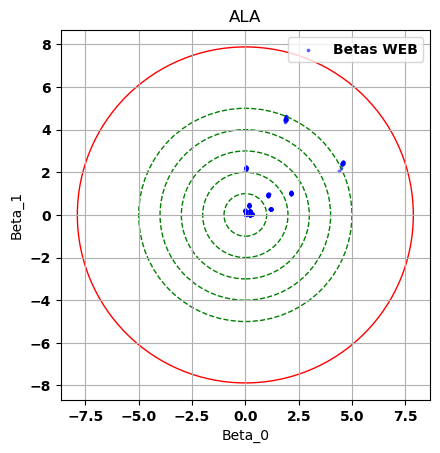

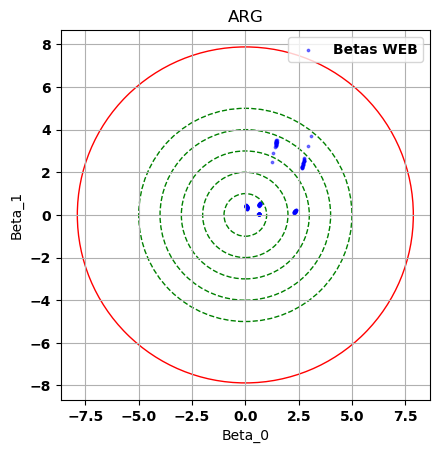

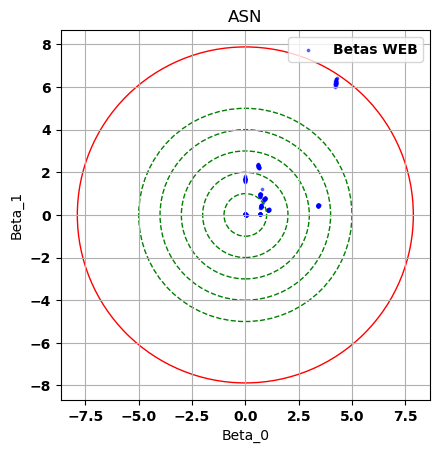

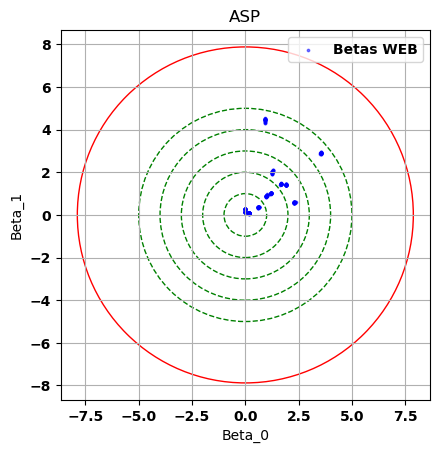

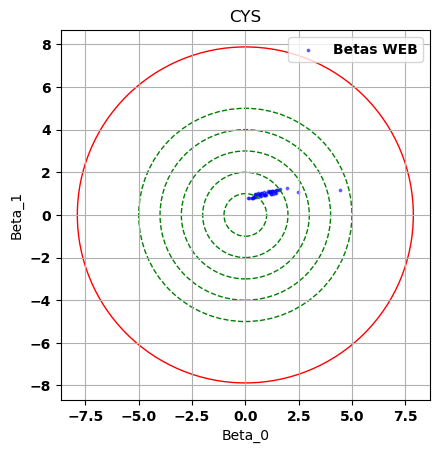

...

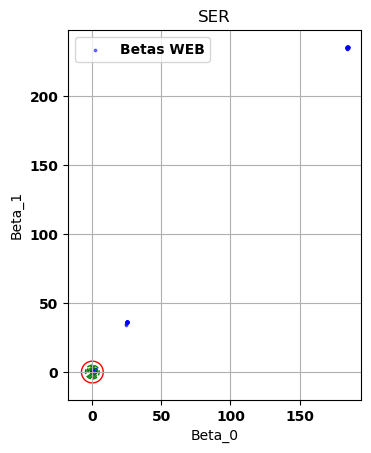

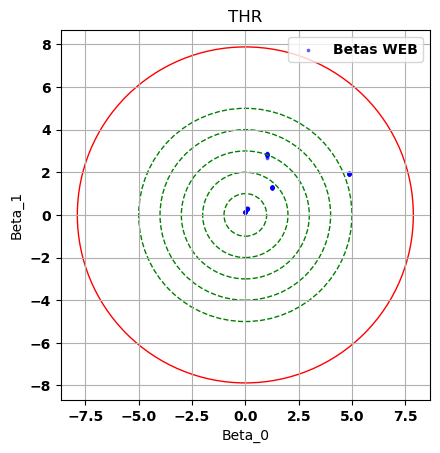

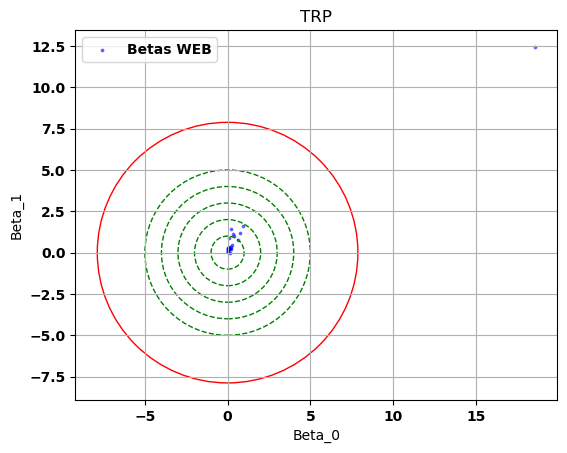

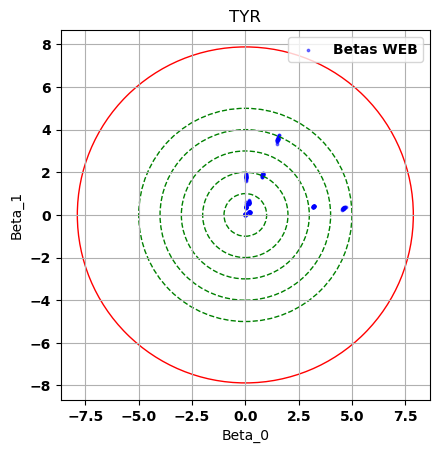

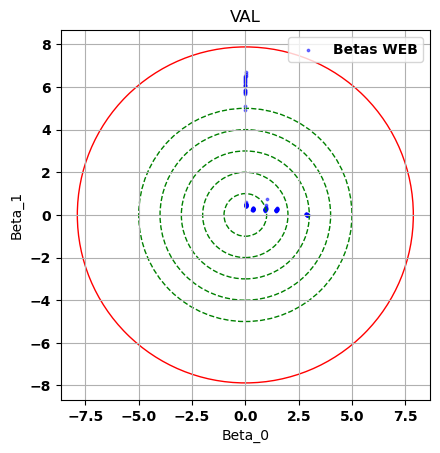

In [85]:
for name in wqeb.data_log:
    AA = np.concatenate((np.array(statistic_distances0[name]).reshape(-1, 1), np.array(statistic_distances1[name]).reshape(-1, 1)), axis=1)
    plot_scatter_with_concentric_circles(AA, 0, 0, 5, 1, margin=margin)
    plt.title(name)
    plt.show()

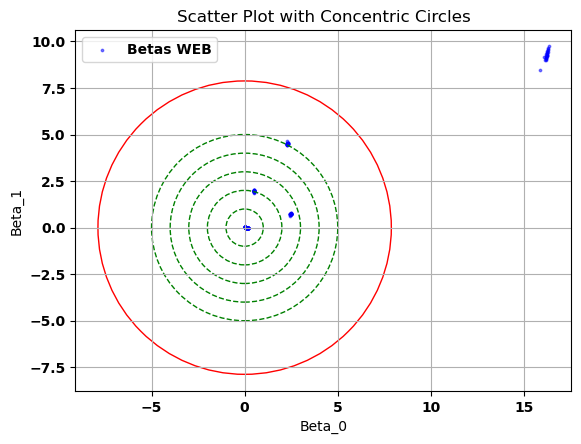

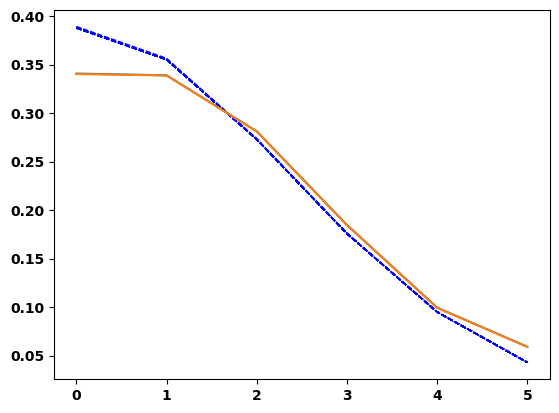

In [22]:
for i in range(len(wqeb.densities_data["TRP"])):
    # plt.plot(wqeb.densities_data["TRP"][i])
    plt.plot(wqeb.densities_betas_WEB["TRP"][i], linestyle="--", c="blue", linewidth=1)
plt.plot(wqeb.densities_data["TRP"][4])
plt.plot(wqeb.densities_data["TRP"][5])

In [15]:
wqeb.betas_WEB["TRP"]

array([[-0.94694542,  4.39517162],
       [-0.9467971 ,  4.40109467],
       [-0.94717875,  4.39742589],
       [-0.94764698,  4.39485408],
       [-0.94359768,  4.40873933],
       [-0.94713816,  4.39807418],
       [-0.94793009,  4.39350645],
       [-0.94728884,  4.39673001],
       [-0.94748139,  4.39544858],
       [-0.94759806,  4.39564663],
       [-0.94685181,  4.3972584 ],
       [-0.94669995,  4.40065357],
       [-0.94784812,  4.39426558],
       [-0.94715136,  4.39760334],
       [-0.94727029,  4.39535623],
       [-0.94694774,  4.40024645],
       [-0.94733767,  4.39538158],
       [-0.94638968,  4.4012902 ],
       [-0.94688286,  4.39855663],
       [-0.94731668,  4.39557923],
       [-0.94711995,  4.39851382],
       [-0.94732772,  4.39846853],
       [-0.94773194,  4.39386156],
       [-0.94758809,  4.39514642]])

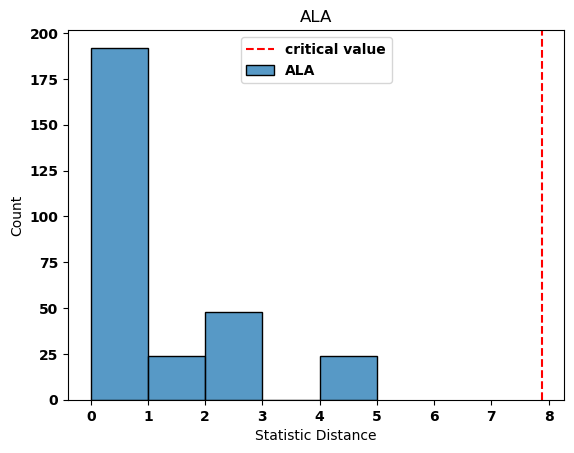

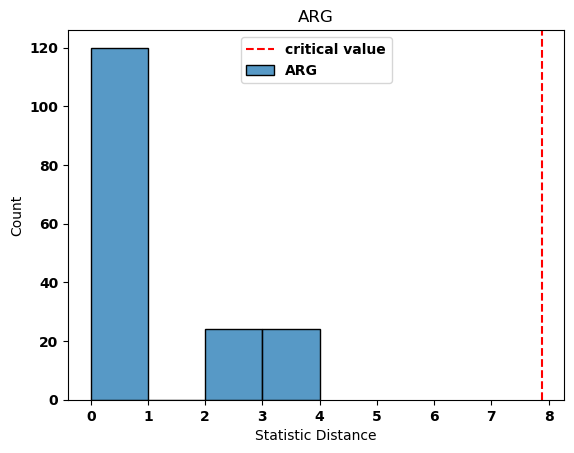

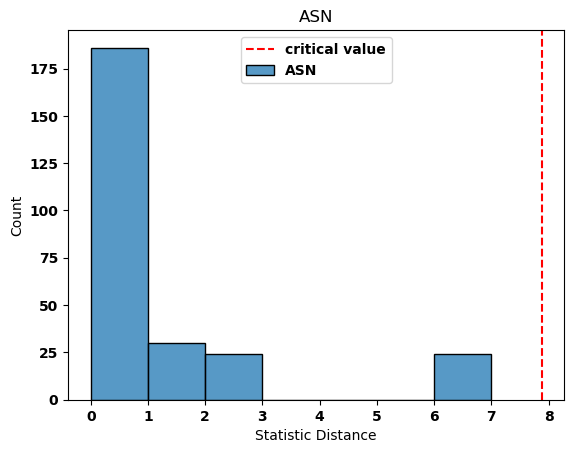

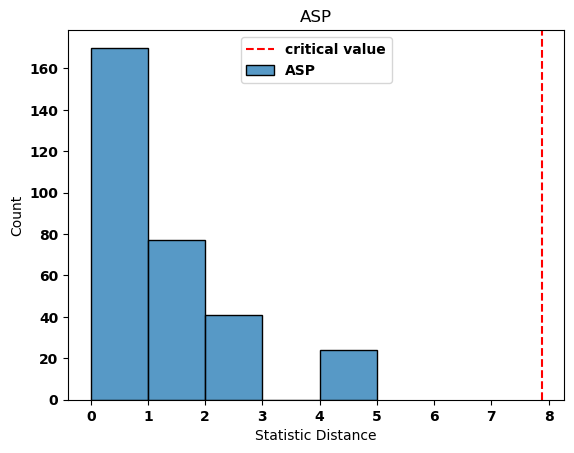

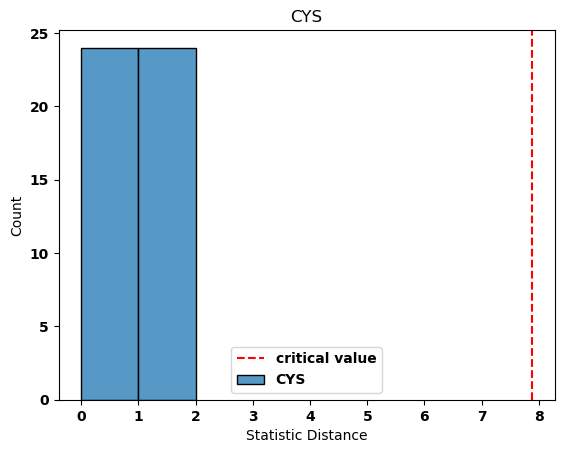

...

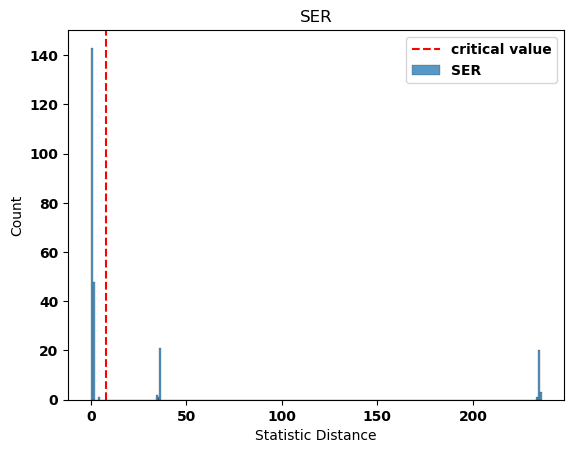

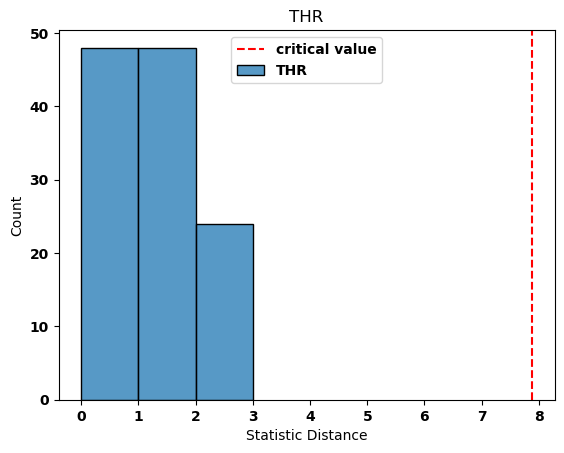

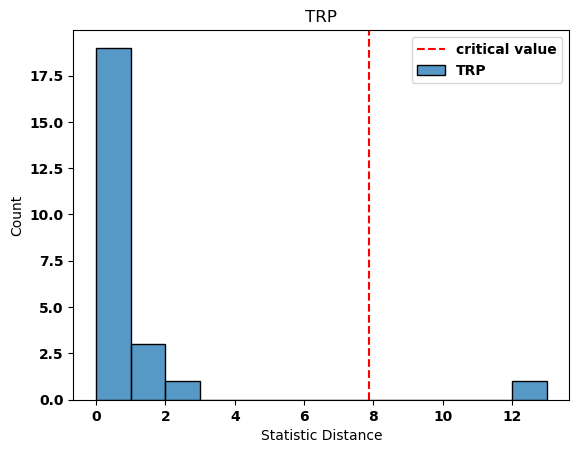

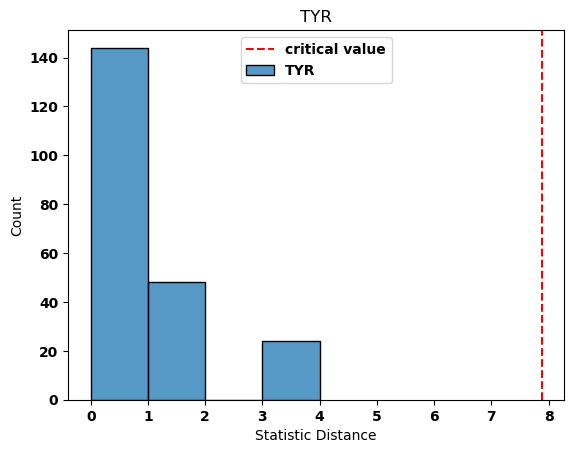

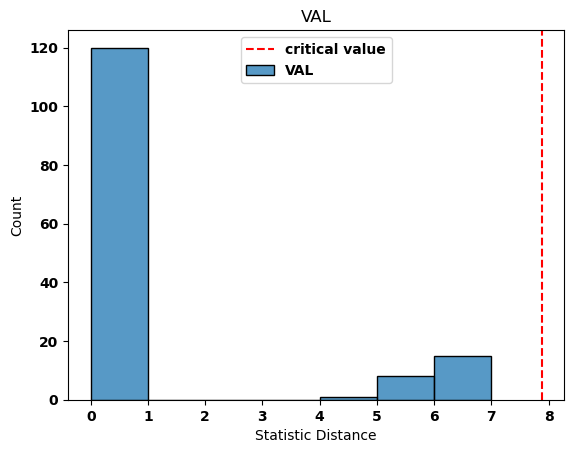

In [56]:
for name in outliers:
    sns.histplot(statistic_distances1[name], bins=np.arange(0, max(statistic_distances1[name]) + 1), label=name)
    plt.axvline(x=margin, color = 'red', label = 'critical value', linestyle = '--')
    plt.xlabel("Statistic Distance")
    plt.ylabel("Count")
    plt.title(name)
    plt.legend()
    plt.show()

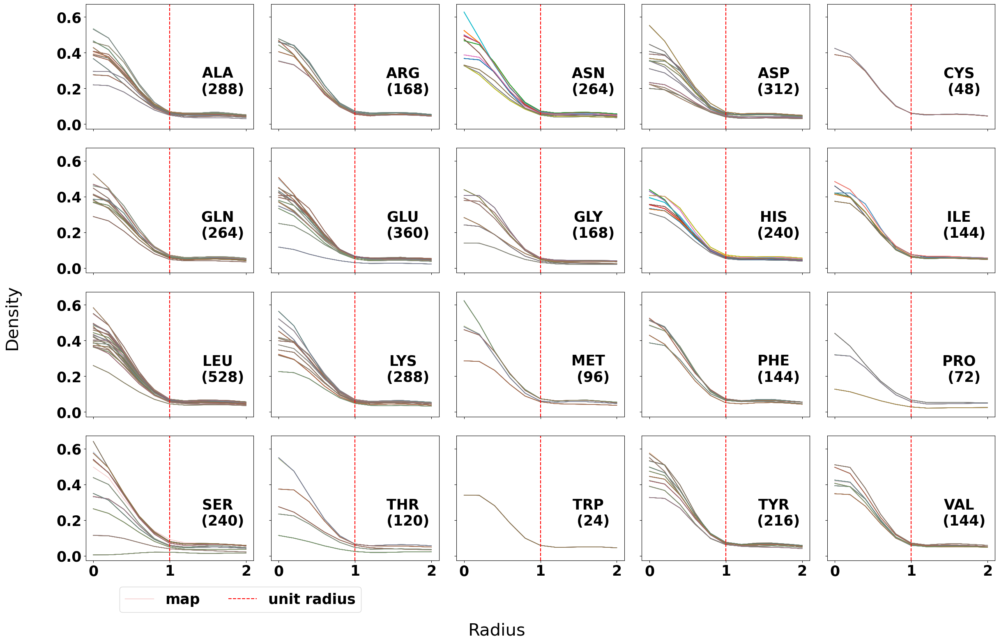

In [8]:
font = {'weight' : 'bold', 'size': 25}
matplotlib.rc('font', **font)
max_radius = 2
gap = 0.2
subplots_num = len(wqeb.densities_data)
nums = int(subplots_num / 5) + 1 if subplots_num % 5 != 0 else int(subplots_num / 5)
fig, axes = plt.subplots(nums, 5, figsize=(25, nums * 4), sharex=True, sharey=True, squeeze=False)
x = np.arange(0, max_radius + gap, gap)
length = len(x)

for times, name in enumerate(wqeb.densities_data): 
    i = times // 5
    j = times % 5
    for density in wqeb.densities_data[name]:
        axes[i][j].plot(x, density[:length], linewidth=1, alpha=0.3, label="map")
    axes[i][j].text(0.8, 0.5, f"{name} \n ({len(wqeb.densities_data[name])})", horizontalalignment='center', verticalalignment='top', transform=axes[i][j].transAxes)
    axes[i][j].axvline(x=1, color = 'red', label = 'unit radius', linestyle = '--')

labels_handles = {
label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())
}

fig.legend(
labels_handles.values(),
labels_handles.keys(),
loc = "upper center",
bbox_to_anchor = (0.25, 0.1),
bbox_transform = plt.gcf().transFigure,
ncol=2
)
fig.supxlabel('Radius')
fig.supylabel('Density')
plt.tight_layout()
fig.tight_layout(rect=(0.025, 0.03, 1, 1))
fig.savefig("../figures/density_maps.png")

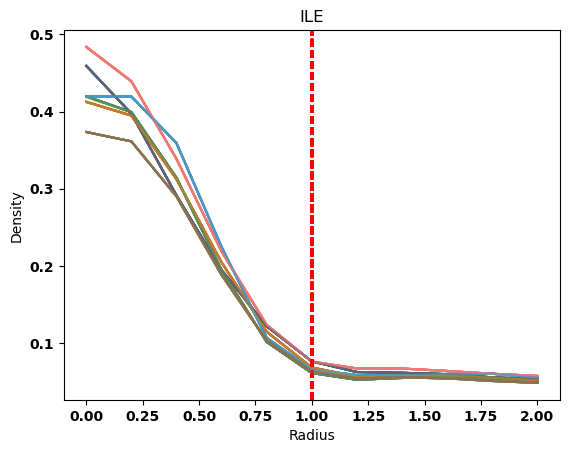

In [8]:
font = {'weight' : 'bold', 'size': 10}
matplotlib.rc('font', **font)
name = "ILE"
for density in wqeb.densities_data[name]:
    plt.plot(x, density[:length], linewidth=1.5, alpha=0.3)
    plt.axvline(x=1, color = 'red', label = 'unit radius', linestyle = '--')
plt.title(name)
plt.xlabel('Radius')
plt.ylabel('Density')
plt.savefig(f"../figures/density_map_{name}.png")

In [7]:
import statsmodels.api as sm

In [8]:
L = []
name = "ALA"
for X, y in zip(wqeb.Xs_tilde[name], wqeb.data_log[name]):
    result = sm.OLS(y, X).fit()
    L.append(result.params)
L = np.array(L)

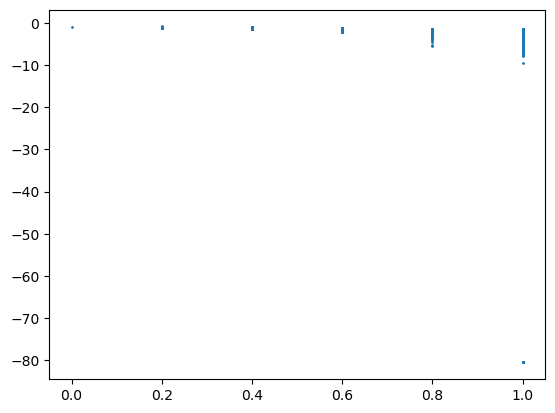

In [16]:
plt.scatter(wqeb.distances_to_center[name][1], wqeb.data_log[name][1], s=1)

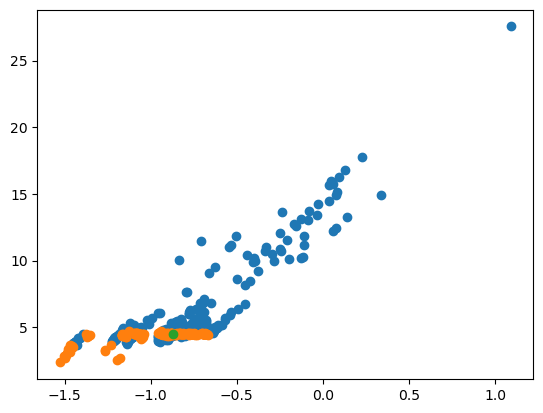

In [9]:
plt.scatter(L[:, 0], L[:, 1])
plt.scatter(wqeb.betas_WEB[name][:, 0], wqeb.betas_WEB[name][:, 1])
plt.scatter(wqeb.mus_mle[name][0], wqeb.mus_mle[name][1])

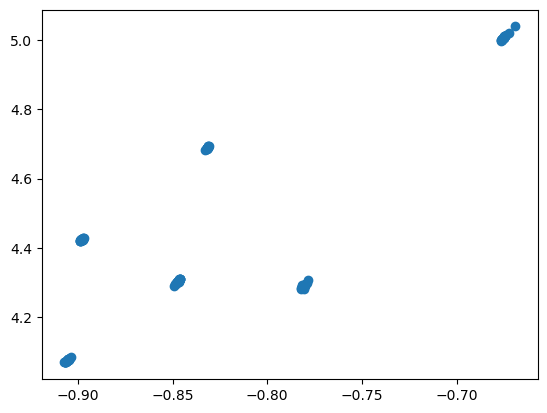

In [24]:
plt.scatter(wqeb.betas_WEB[name][:, 0], wqeb.betas_WEB[name][:, 1])

In [23]:
ppdb = PandasPdb().read_pdb("./dataset/6z6u.pdb")
df = ppdb.df['ATOM']

In [28]:
np.unique(df[(df["occupancy"] != 1) & (df["atom_name"] == "CA")]["residue_name"].values, return_counts=True)

(array(['ARG', 'ASN', 'GLU', 'ILE', 'LEU', 'LYS', 'SER', 'THR'],
       dtype=object),
 array([ 48,  48,  48,  48,  48, 192,  48,  48]))

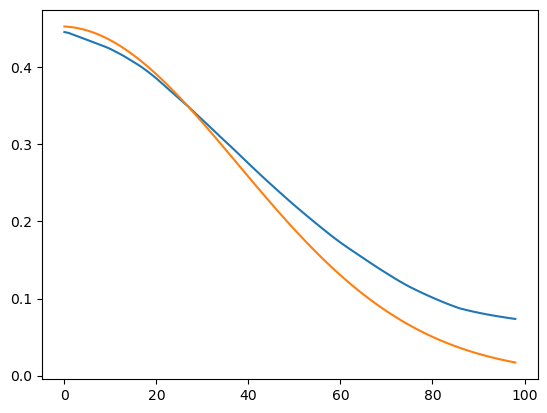

In [ ]:
name = "GLN"
plt.plot(wqeb.densities_data[name][outliers[name][0]])
plt.plot(wqeb.densities_estimated[name][outliers[name][0]])

In [ ]:
# chosen_densities = wqeb.densities_data[name][outliers[name]]
# chosen_estimated_densities = dm[name][outliers[name]]
# chosen_num = int(len(chosen_estimated_densities) / 5)
# fig, axes = plt.subplots(chosen_num + 1, 5, figsize=(20, chosen_num * 5), sharex=True, sharey=True,  squeeze=False)
# for times, elements in enumerate(zip(chosen_densities, chosen_estimated_densities)):
#     chosen_density, chosen_estimated_density = elements
#     i = times // 5
#     j = times % 5
#     axes[i][j].plot(chosen_density)
#     axes[i][j].plot(chosen_estimated_density)

In [ ]:
# fig, axes = plt.subplots(1, 3, figsize=(15, 5))
# i = 0
# for name, outlier_all in outliers.items():
#     for outlier in outlier_all:
#         axes[i].plot(wqeb.weighted_estimated_radius_density[name][outlier], "-.", label="WEB estimate")
#         axes[i].plot(wqeb.radius_density[name][outlier], label="density map")
#         axes[i].text(i*1.2 + 0.3, 0.5, f'Statistic Distances: \n{statistic_distances[name][outlier]} >{np.round(margin, 2)}', horizontalalignment='center', verticalalignment='center', transform=axes[0].transAxes)
#         axes[i].title.set_text(name)
#         axes[i].legend()
#         i += 1
# plt.show()

In [ ]:
wqeb.weighted_estimated_radius_density[name]

4.692166657053904

In [ ]:
qscores_all = {}
for name in wqeb.densities_data:
    qscores = []
    for data_density, estimated_density in zip(wqeb.densities_data[name], dm[name]):
        data_density = np.array(data_density)
        estimated_density = np.array(estimated_density)
        numerator = np.dot(data_density - data_density.mean(), estimated_density - estimated_density.mean())
        denominator = np.sqrt(sum((data_density - data_density.mean())**2)) * np.sqrt(sum((estimated_density - estimated_density.mean())**2))
        qscores.append(numerator / denominator)
    qscores_all[name] = qscores

In [ ]:
# for name in qscores_all:
#     result = pd.DataFrame(qscores_all[name], columns=[name]) [(pd.DataFrame(qscores_all[name], columns=[name]) < 0.95).values.flatten()]
#     if len(result) > 0:
#         for idx, i in enumerate(result.index):
#             print(result.iloc[idx, :])
#             plt.plot(wqeb.densities_data[name][result.index[idx]])
#             plt.plot(dm[name][result.index[idx]])
#             plt.show()
#     else:
#         print(f"{name} has no lower qscore")

In [ ]:
dfs = [pd.DataFrame(qscores_all[name], columns=[name]) for name in qscores_all]

In [ ]:
max_num = max([len(qscores) for qscores in qscores_all.values()])
for qscores in qscores_all:
    qscores_all[qscores] = qscores_all[qscores] + [0] * (max_num - len(qscores_all[qscores]))

In [ ]:
pd.DataFrame(qscores_all)

,ALA,ARG,ASN,ASP,CYS,GLN,GLU,GLY,HIS,ILE,LEU,LYS,MET,PHE,PRO,SER,THR,TRP,TYR,VAL
0,0.988510,0.997775,0.994321,0.999472,0.999618,0.997579,0.999113,0.993505,0.998377,0.996260,0.999334,0.994895,0.991201,0.997054,0.998100,0.841654,0.993061,0.993581,0.998851,0.999122
1,0.999061,0.999708,0.998914,0.997412,0.997454,0.997603,0.991667,0.999520,0.997600,0.999388,0.999784,0.998206,0.998177,0.997929,0.988817,0.999405,0.997806,0.994366,0.999587,0.998766
2,0.998362,0.997260,0.999184,0.994368,0.999623,0.999913,0.999445,0.999655,0.994664,0.999000,0.999725,0.999539,0.999108,0.999163,0.997607,0.996047,0.994748,0.994245,0.996232,0.997679
3,0.998305,0.999476,0.997878,0.989547,0.997722,0.999299,0.998186,0.989935,0.999213,0.998308,0.999121,0.999369,0.992849,0.999204,0.998067,0.997444,0.996937,0.994000,0.998679,0.996288
4,0.999086,0.999601,0.998866,0.995033,0.999314,0.997969,0.993462,0.997523,0.996856,0.987665,0.986518,0.998199,0.990254,0.998078,0.989400,0.995735,0.998416,0.995473,0.996844,0.993822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.999663,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
524,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.998714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
525,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.998845,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
526,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.999756,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


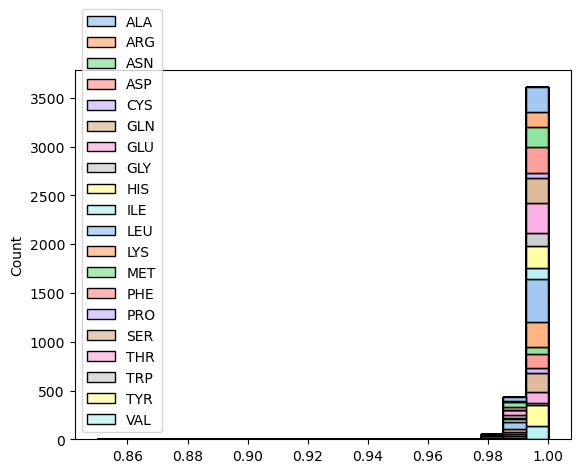

In [ ]:
import seaborn as sns
for df in dfs:
    sns.histplot(pd.DataFrame(qscores_all), binrange=(0.85, 1), stat="count", bins=20, multiple="stack", kde=False, palette="pastel", element="bars", legend=True)

(array([  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,
          0.,   0.,   0.,   0.,   1.,   1.,   0.,   0.,   0.,   1.,   1.,
          0.,   0.,   1.,   0.,   2.,   0.,   3.,   2.,   5.,   4.,  13.,
          9.,  35.,  92.,  88., 121., 397.]),
 array([0.96775529, 0.96842639, 0.9690975 , 0.9697686 , 0.97043971,
        0.97111081, 0.97178192, 0.97245302, 0.97312413, 0.97379523,
        0.97446634, 0.97513745, 0.97580855, 0.97647966, 0.97715076,
        0.97782187, 0.97849297, 0.97916408, 0.97983518, 0.98050629,
        0.98117739, 0.9818485 , 0.9825196 , 0.98319071, 0.98386181,
        0.98453292, 0.98520402, 0.98587513, 0.98654623, 0.98721734,
        0.98788844, 0.98855955, 0.98923066, 0.98990176, 0.99057287,
        0.99124397, 0.99191508, 0.99258618, 0.99325729, 0.99392839,
        0.9945995 , 0.9952706 , 0.99594171, 0.99661281, 0.99728392,
        0.99795502, 0.99862613, 0.99929723, 0.

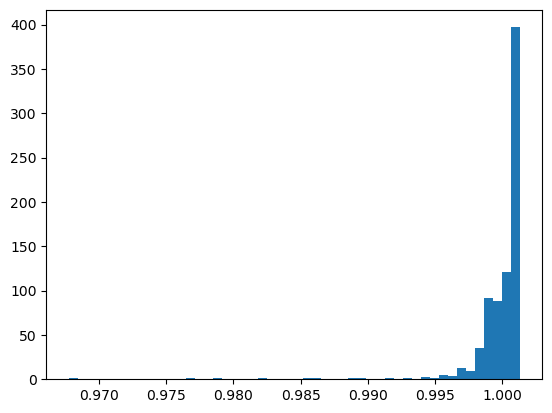

In [ ]:
plt.hist((np.diag(wqeb.weight_matrixs["SER"][0])), bins=50)

In [ ]:
import random
number_of_colors = 20
color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])for i in range(number_of_colors)]
print(color)

['#74190E', '#A54EBC', '#122D69', '#DFC700', '#598A2F', '#89DCC1', '#5479A1', '#1FD4F2', '#4BD1EC', '#E13F40', '#14A3B6', '#CF31EA', '#394C93', '#61CEB6', '#EB211F', '#80672D', '#934DD2', '#3D23D4', '#0EDD0F', '#A82B23']


In [ ]:
wqeb.mus_mle["ALA"]

{'ALA': array([-0.87660058,  4.59262477]),
 'ARG': array([-0.78994986,  4.73026486]),
 'ASN': array([-0.71501642,  4.80958684]),
 'ASP': array([-0.9851642 ,  4.29383163]),
 'CYS': array([-0.87361586,  4.67492292]),
 'GLN': array([-0.91810809,  4.5990282 ]),
 'GLU': array([-0.92666652,  4.50355831]),
 'GLY': array([-0.8690076 ,  4.40636273]),
 'HIS': array([-0.98773511,  4.14517375]),
 'ILE': array([-0.82277876,  4.40198261]),
 'LEU': array([-0.81039186,  4.5692218 ]),
 'LYS': array([-0.97889209,  4.32631076]),
 'MET': array([-0.71419118,  4.94367685]),
 'PHE': array([-0.67838404,  4.59379179]),
 'PRO': array([-1.04663851,  4.27632024]),
 'SER': array([-1.08426796,  4.3563413 ]),
 'THR': array([-0.9143432,  4.1516018]),
 'TRP': array([-1.01104346,  3.88229404]),
 'TYR': array([-0.70272213,  4.51152423]),
 'VAL': array([-0.85555125,  4.46891164])}

In [ ]:
Counter(wqeb.Xs_tilde[name][i][:]).keys()

TypeError: unhashable type: 'numpy.ndarray'

In [ ]:
np.array(list(Counter(wqeb.Xs_tilde[name][i]).keys())).reshape(-1, 1)

TypeError: unhashable type: 'numpy.ndarray'

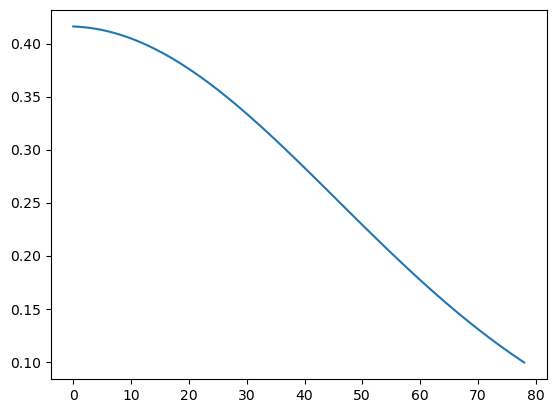

In [ ]:
name = "ALA"
i = 0
distance = np.array(list(Counter(wqeb.distances_to_center[name][i]).keys())).reshape(-1, 1)
X = np.concatenate((np.ones_like(distance), -1/2 * distance**2), axis=1)
plt.plot(np.exp(X @ wqeb.mus_mle[name]))

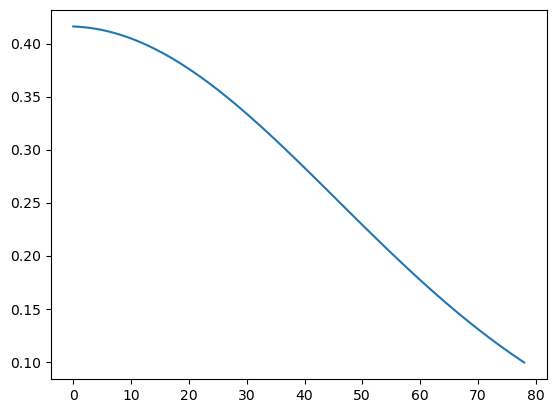

In [ ]:
plt.plot(np.exp(X @ wqeb.mus_mle[name]))

In [ ]:
np.sum(wqeb.betas_em[name] * np.repeat(wqeb.lambdas[name], 2).reshape(-1, 2), axis=0) / np.sum(wqeb.lambdas[name])

array([-0.84424106,  4.47301268])

In [ ]:
np.mus_mle[name]

AttributeError: module 'numpy' has no attribute 'mus_mle'

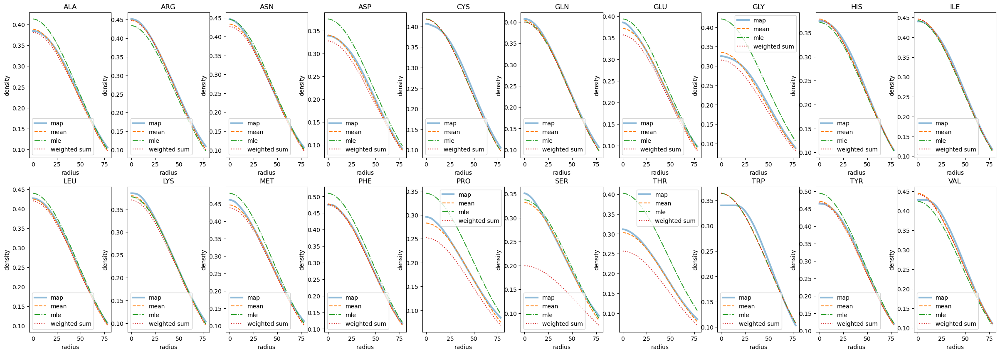

In [ ]:
# axes, fig = plt.subplots(10, 2, figsize=(10, 5))
import random
number_of_colors = 20
color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])for i in range(number_of_colors)]
fig, axes = plt.subplots(2, 10, figsize=(30, 10))
for times, name in enumerate(wqeb.weighted_estimated_radius_density):
    # plt.figure(figsize=(8, 6))
    i = times // 10
    j = times % 10
    distance = np.array(list(Counter(wqeb.distances_to_center[name][0]).keys())).reshape(-1, 1)
    X = np.concatenate((np.ones_like(distance), -1/2 * distance**2), axis=1)
    weighted__betas_em = np.sum(wqeb.betas_em[name] * np.repeat(wqeb.lambdas[name], 2).reshape(-1, 2), axis=0) / np.sum(wqeb.lambdas[name])
    axes[i][j].plot(np.array(wqeb.radius_density[name]).mean(axis=0), label="map", linewidth=3, alpha=0.5)
    axes[i][j].plot(np.array(wqeb.weighted_estimated_radius_density[name]).mean(axis=0), label="mean", linestyle="--")
    axes[i][j].plot(np.exp(X @ wqeb.mus_mle[name]), label="mle", linestyle="-.")
    axes[i][j].plot(np.exp(X @ weighted__betas_em), label="weighted sum", linestyle=":")
    # plt.title(name)
    axes[i][j].set_xlabel("radius")
    axes[i][j].set_ylabel("density")
    axes[i][j].legend()
    axes[i][j].title.set_text(name)
plt.show()

In [ ]:
wqeb.mus_mle

{'ALA': array([-0.87660058,  4.59262477]),
 'ARG': array([-0.78994986,  4.73026486]),
 'ASN': array([-0.71501642,  4.80958684]),
 'ASP': array([-0.9851642 ,  4.29383163]),
 'CYS': array([-0.87361586,  4.67492292]),
 'GLN': array([-0.91810809,  4.5990282 ]),
 'GLU': array([-0.92666652,  4.50355831]),
 'GLY': array([-0.8690076 ,  4.40636273]),
 'HIS': array([-0.98773511,  4.14517375]),
 'ILE': array([-0.82277876,  4.40198261]),
 'LEU': array([-0.81039186,  4.5692218 ]),
 'LYS': array([-0.97889209,  4.32631076]),
 'MET': array([-0.71419118,  4.94367685]),
 'PHE': array([-0.67838404,  4.59379179]),
 'PRO': array([-1.04663851,  4.27632024]),
 'SER': array([-1.08426796,  4.3563413 ]),
 'THR': array([-0.9143432,  4.1516018]),
 'TRP': array([-1.01104346,  3.88229404]),
 'TYR': array([-0.70272213,  4.51152423]),
 'VAL': array([-0.85555125,  4.46891164])}

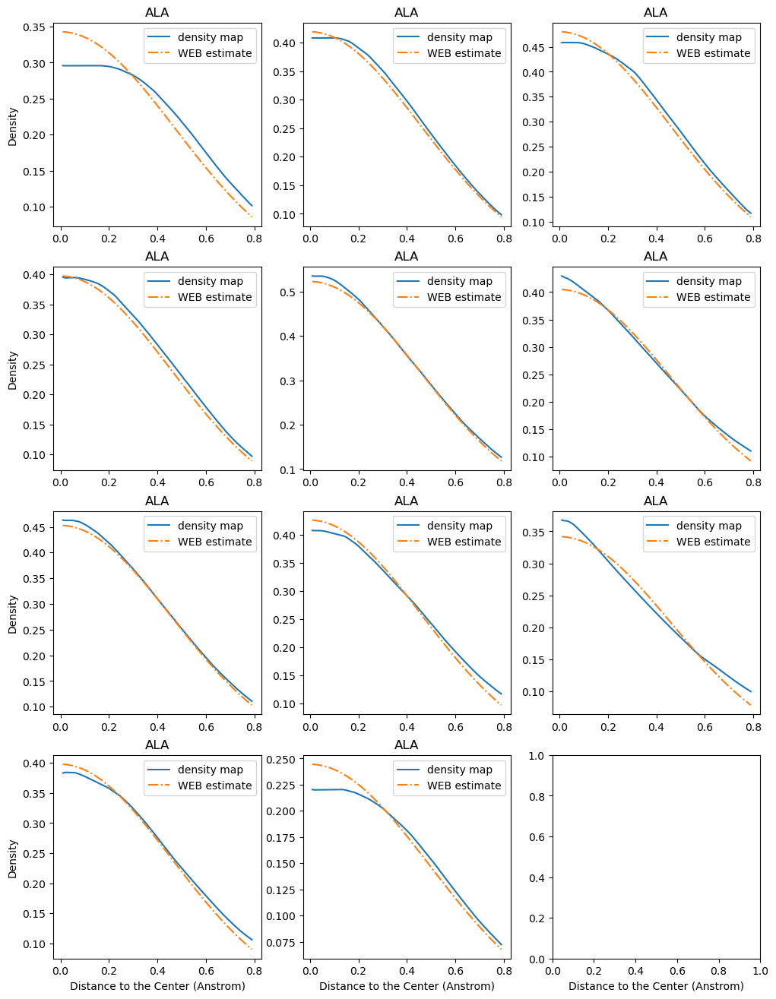

In [ ]:
wqeb.plot_data(max_rad=MAX_RAD, amino_acid="ALA")

In [ ]:
wqeb.lambdas

{'ALA': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'ARG': array([1., 1., 1., 1., 1., 1.]),
 'ASN': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'ASP': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'CYS': array([1., 1.]),
 'GLN': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'GLU': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'GLY': array([1., 1., 1., 1., 1., 1.]),
 'HIS': array([1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'ILE': array([1., 1., 1., 1., 1.]),
 'LEU': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1.]),
 'LYS': array([1., 1., 1., 1., 1., 1., 1., 1.]),
 'MET': array([1., 1., 1., 1.]),
 'PHE': array([1., 1., 1., 1., 1.]),
 'PRO': array([1., 1., 1.]),
 'SER': array([1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'THR': array([1., 1., 1.]),
 'TRP': array([1.]),
 'TYR': array([1., 1., 1., 1., 1., 1., 1., 1.]),
 'VAL': array([1., 1., 1., 1., 1., 1.])}

In [ ]:
np.sum([np.diag(weight_matrix) for weight_matrix in wqeb.weight_matrixs["ARG"]], axis=1)

array([ 9.64056906, 10.30311278, 16.26903541,  6.88385489,  9.74026675,
        4.78045152])

In [ ]:
sum(np.diag(wqeb.weight_matrixs["ARG"][0]))

14.771551040153259

In [ ]:
wqeb.lambdas["ALA"]

array([9.86910618e-03, 7.21454557e-01, 8.80831148e+01, 2.81393345e-03,
       2.10461944e+01, 5.47358245e+02, 1.99384146e+02, 2.51712815e-01,
       3.97569654e+01, 6.55253284e+02, 4.32358810e-01])

In [ ]:
sum(np.diag(wqeb.weight_matrixs["ALA"][0]))

11085.148740234481

(array([ 27.,  27.,  30.,  42.,  83.,  63., 123., 106.,  79., 200.]),
 array([1.24477225e-10, 4.07131907e-03, 8.14263801e-03, 1.22139569e-02,
        1.62852759e-02, 2.03565948e-02, 2.44279138e-02, 2.84992327e-02,
        3.25705516e-02, 3.66418706e-02, 4.07131895e-02]),
 <BarContainer object of 10 artists>)

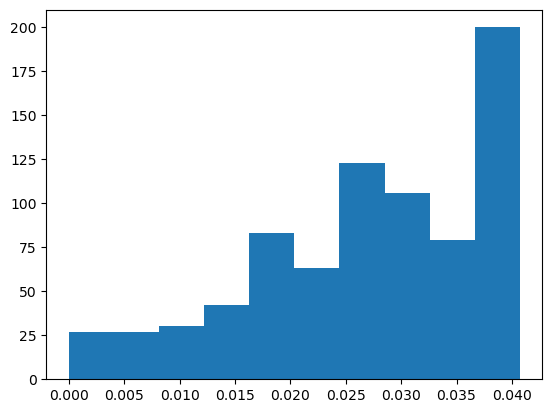

In [ ]:
plt.hist(np.diag(wqeb.weight_matrixs["ALA"][0]))

In [ ]:
wqeb.sigmas_median

{'ALA': array([[0.08296717],
        [0.00600139],
        [0.02039314],
        [0.01844067],
        [0.06198955],
        [0.01429305],
        [0.0129889 ],
        [0.01145318],
        [0.04682179],
        [0.01050427],
        [0.24638906]]),
 'ARG': array([[0.01342249],
        [0.01676857],
        [0.02634037],
        [0.01009092],
        [0.01643886],
        [0.00694597]]),
 'ASN': array([[0.01168207],
        [0.03012414],
        [0.02851927],
        [0.0271333 ],
        [0.0253392 ],
        [0.00386329],
        [0.02136898],
        [0.09683823],
        [0.11144845],
        [0.04235467]]),
 'ASP': array([[0.00415755],
        [0.11128924],
        [0.04922485],
        [0.03801172],
        [0.06412251],
        [0.1468876 ],
        [0.18449686],
        [0.08632697],
        [0.1081827 ],
        [0.03019127],
        [0.01896297],
        [0.05295359]]),
 'CYS': array([[0.00710726],
        [0.00763726]]),
 'GLN': array([[0.01800528],
        [0.00906062],
  